In [ ]:
import matplotlib.pyplot as plt
import numpy

from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [ ]:
#!sudo cp -v -r "/content/drive/MyDrive/ASI/Lab4/Task 2/vis_white_powders/capture" "/content/drive/MyDrive/ASI/Lab4/Task 2/ext vis"

'/content/drive/MyDrive/ASI/Lab4/Task 2/vis_white_powders/capture' -> '/content/drive/MyDrive/ASI/Lab4/Task 2/ext vis/capture'
'/content/drive/MyDrive/ASI/Lab4/Task 2/vis_white_powders/capture/DARKREF_vis_scan_0078.log' -> '/content/drive/MyDrive/ASI/Lab4/Task 2/ext vis/capture/DARKREF_vis_scan_0078.log'
'/content/drive/MyDrive/ASI/Lab4/Task 2/vis_white_powders/capture/DARKREF_vis_scan_0078.raw' -> '/content/drive/MyDrive/ASI/Lab4/Task 2/ext vis/capture/DARKREF_vis_scan_0078.raw'
'/content/drive/MyDrive/ASI/Lab4/Task 2/vis_white_powders/capture/DARKREF_vis_scan_0078.hdr' -> '/content/drive/MyDrive/ASI/Lab4/Task 2/ext vis/capture/DARKREF_vis_scan_0078.hdr'
'/content/drive/MyDrive/ASI/Lab4/Task 2/vis_white_powders/capture/WHITEREF_vis_scan_0078.raw' -> '/content/drive/MyDrive/ASI/Lab4/Task 2/ext vis/capture/WHITEREF_vis_scan_0078.raw'
'/content/drive/MyDrive/ASI/Lab4/Task 2/vis_white_powders/capture/WHITEREF_vis_scan_0078.hdr' -> '/content/drive/MyDrive/ASI/Lab4/Task 2/ext vis/capture/WH

#Visible Camera

In [ ]:
# read dir and search for WHITE, DARK and OBJECT (RAW and HDR)
def readDir(dir_path):
    myDir = os.listdir(dir_path)
    dark_hdr =[]
    dark_raw=[]
    white_hdr=[]
    white_raw=[]
    for file in myDir:
        if 'dark' in file.lower() and 'hdr' in file.lower():
            #dark_hdr = dir_path + '/' + file
            dark_hdr = os.path.join(dir_path, file)
        if 'dark' in file.lower() and 'raw' in file.lower():
            #dark_raw = dir_path + '/' + file
            dark_raw = os.path.join(dir_path, file)
        if 'white' in file.lower() and 'hdr' in file.lower():
            #white_hdr = dir_path + '/' + file
            white_hdr = os.path.join(dir_path, file)
        if 'white' in file.lower() and 'raw' in file.lower():
            #white_raw = dir_path + '/' + file
            white_raw = os.path.join(dir_path, file)
        if (not 'white' in file.lower()) and (not 'dark' in file.lower()) and 'hdr' in file.lower():
            #object_hdr = dir_path + '/' + file
            object_hdr = os.path.join(dir_path, file)
        if (not 'white' in file.lower()) and (not 'dark' in file.lower()) and 'raw' in file.lower():
            #object_raw = dir_path + '/' + file
            object_raw = os.path.join(dir_path, file)
    return object_raw, object_hdr, white_raw, white_hdr, dark_raw, dark_hdr  
import os
import numpy

##### Read HDR content
def read_hdr(hdr_path):
    f=open(hdr_path, "r")
    filelines = f.readlines()
    #print(filelines)
    f.close()
    bands = ''
    for fileline in filelines:
        #print(fileline)
        if 'samples' in fileline.lower():
            samples = int(fileline.replace('samples = ',''))
            print(samples)
        if bands =='' and 'bands' in fileline.lower():
            bands = int(fileline.replace('bands = ',''))
        if 'lines' in fileline.lower():
            lines = int(fileline.replace('lines = ',''))
    # read waves   
    print(samples, lines, bands)
    n = 0
    for fileline in filelines:
        if 'th = {' in fileline.lower():
          print(n)
          n1 = n+1
        n = n + 1
    n2 = n1 + bands
    print(n1)
    print(n2)
    waves = numpy.zeros(n2-n1,)
    n = 0
    for i in range(n1, n2):
        #print(filelines[i])
        waves[n] = float(filelines[i].replace(',',''))
        #print(waves[n])
        n = n + 1
    
    return samples, bands, lines, waves     

In [ ]:
# Read hdr

path = "/content/drive/MyDrive/ASI/Lab4/Task 2/ext vis/capture"

#path = "/content/drive/My Drive/Colab Notebooks/Spectral files/Specim IQ/Colorchecker 121 ms/capture/"
#myDir = os.listdir(path)
[object_raw, object_hdr, white_raw, white_hdr, dark_raw, dark_hdr ] = readDir(path)
print(object_raw)
[samples, bands, lines, waves] = read_hdr(object_hdr)

open_path = object_raw
# Read raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
spectral_image = numpy.reshape(raw_image, (lines, bands, samples))
print('spectral_image.shape: ', spectral_image.shape)

/content/drive/MyDrive/ASI/Lab4/Task 2/ext vis/capture/vis_scan_0078.raw
2144
2144 1895 135
54
55
190
spectral_image.shape:  (1895, 135, 2144)


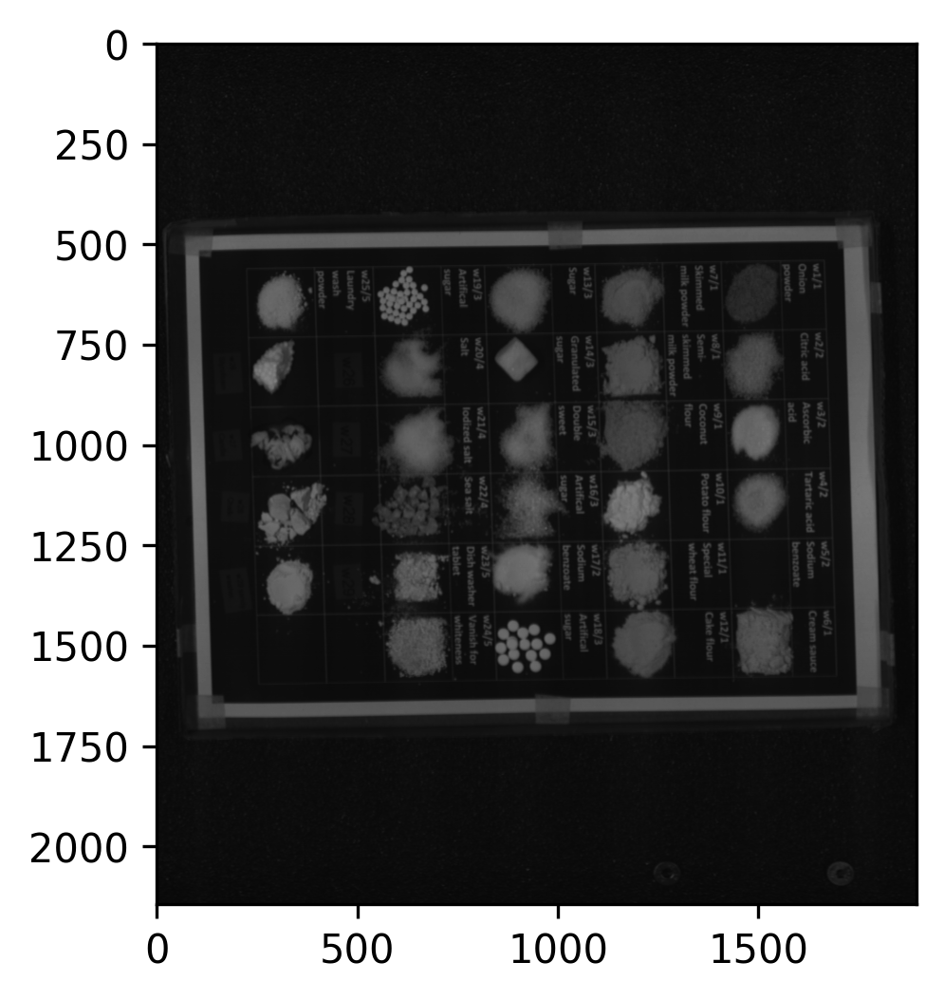

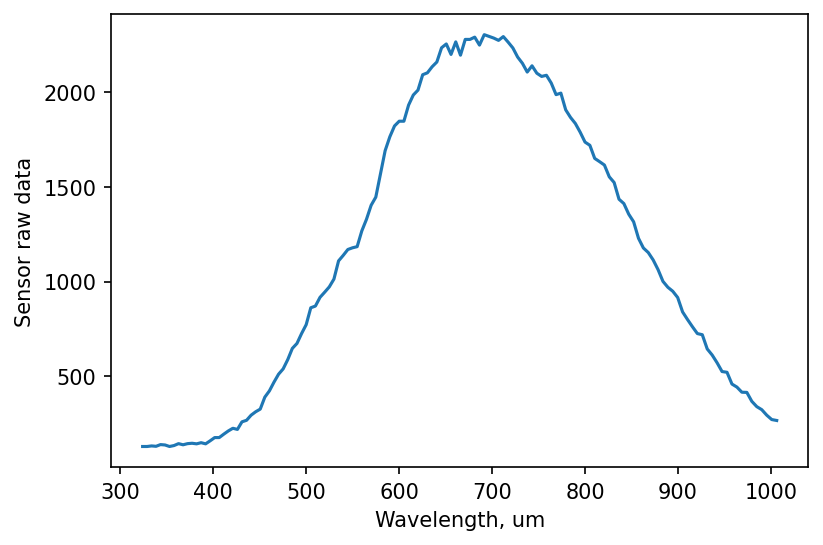

In [ ]:
# Plot picture and spectrum

plt.rcParams['figure.dpi'] = 300

#fig.suptitle('Spectral cube slice and single spectrum')
img = spectral_image[:,20,:]
# pale with selected band and vmax=4700
plt.imshow(numpy.rot90(img), cmap="gray", vmin=0, vmax=4700)#
plt.show()
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, spectral_image[100,:,100])#
plt.xlabel('Wavelength, um')
plt.ylabel('Sensor raw data')

plt.show()

/content/drive/MyDrive/ASI/Lab4/Task 2/ext vis/capture/WHITEREF_vis_scan_0078.hdr
2144
2144 297 135
54
55
190
2144 135 297


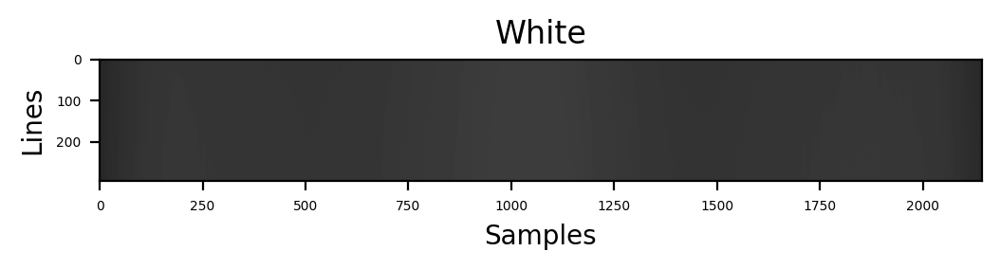

2144
2144 100 135
54
55
190


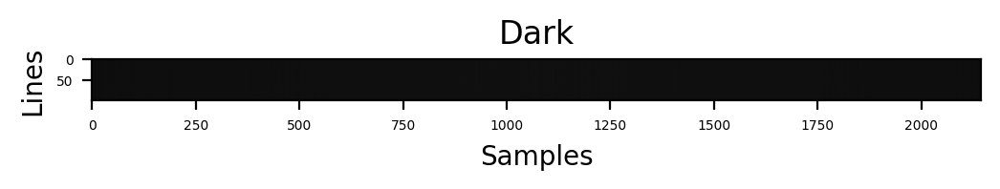

In [ ]:
# Read White
print(white_hdr)
[samples, bands, lines, waves] = read_hdr(white_hdr)
print(samples, bands, lines)
open_path = white_raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
white_image = numpy.reshape(raw_image, (lines, bands, samples))/lines
plt.rcParams['figure.dpi'] = 200
plt.imshow(white_image[:,100,:], cmap="gray", vmin=0, vmax=500)#
plt.title("White")
plt.xlabel('Samples')
plt.ylabel('Lines')
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()
###############################################
# Read Dark
[samples, bands, lines, waves] = read_hdr(dark_hdr)
open_path = dark_raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
dark_image = numpy.reshape(raw_image, (lines, bands, samples))/lines

plt.rcParams['figure.dpi'] = 200
plt.imshow(dark_image[:,100,:], cmap="gray", vmin=0, vmax=20)#
plt.title("Dark")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.xlabel('Samples')
plt.ylabel('Lines')
plt.show()


In [ ]:
# Calculate average for Dark and White

# Spectral_cube = upper_part/lower_part
# upper_part = spectral_image-dark
# lower_part = white - dark

white_av = numpy.sum(white_image, axis = 0) # get average for White
#print(white_image.shape)
#print(white_av.shape)
dark_av = numpy.sum(dark_image, axis = 0) # get average for White
#print(dark_image.shape)
#print(dark_av.shape)

[lines, bansd, samples] = spectral_image.shape
print(spectral_image.shape)
upper_part = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
spectral_cube = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
# Subtract [image - dark]
for i in range(lines):
  upper_part[i,:,:] = numpy.subtract(spectral_image[i,:,:], dark_av) 
# Subtract [white - dark]
lower_part = numpy.subtract(white_av, dark_av) 
# Subtract [image - dark]
for i in range(lines):
  spectral_cube[i,:,:] = numpy.divide(upper_part[i,:,:], lower_part)
# spectral_cube[:,:,:]  a white corrected spectral cube

(1895, 135, 2144)


(135, 1895, 2144)


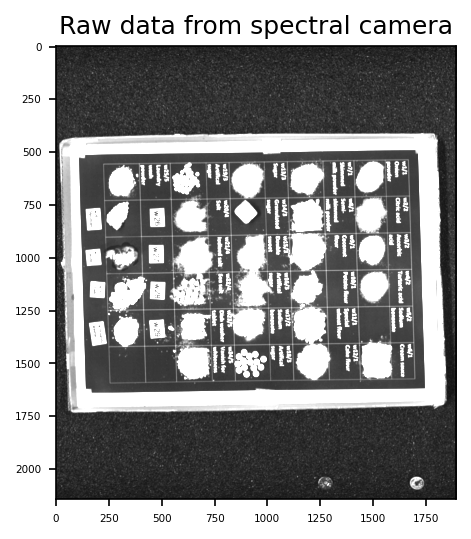

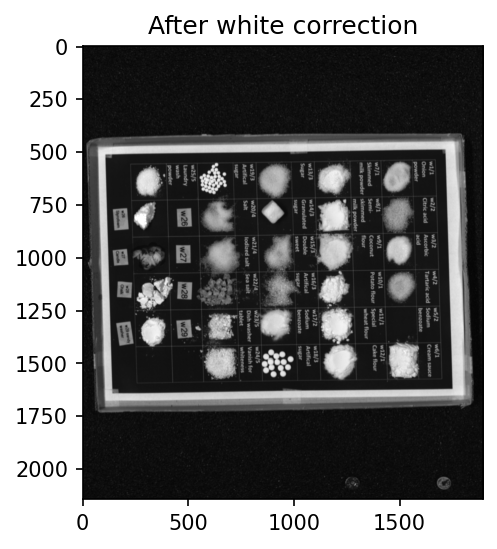

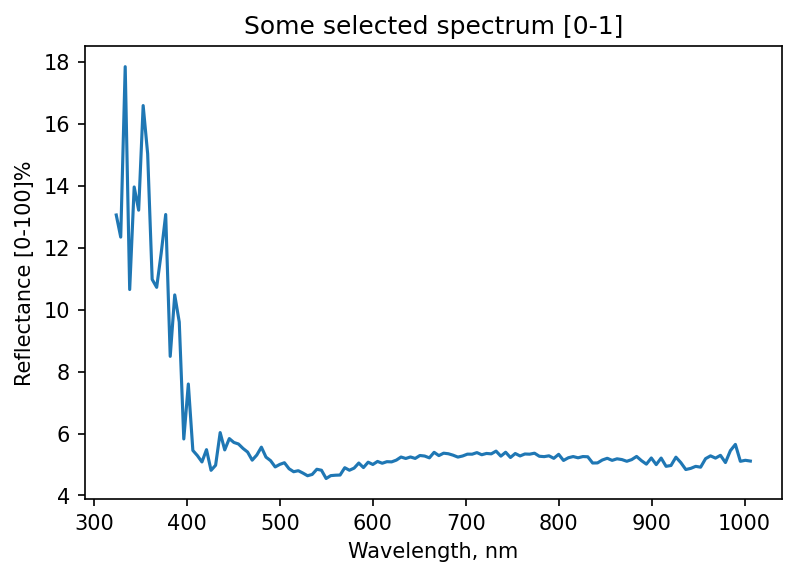

In [ ]:
# Plot results before and after white correction
plt.rcParams['figure.dpi'] = 150
print((numpy.rot90(spectral_image)).shape)
plt.imshow(numpy.rot90(spectral_image[:,100,:]), cmap="gray", vmin=0, vmax=10050)#
plt.title("Raw data from spectral camera")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()
plt.imshow(numpy.rot90(spectral_cube[:,100,:]), cmap="gray", vmin=0, vmax= 1)#
plt.title("After white correction")
plt.tick_params(axis='both', which='major', labelsize=10)
plt.show()
plt.plot(waves, spectral_cube[200,:,200]*100)#
plt.title("Some selected spectrum [0-1]")
plt.tick_params(axis='both', which='major', labelsize=10)
plt.xlabel('Wavelength, nm')
plt.ylabel('Reflectance [0-100]%')
plt.show()

AttributeError: ignored

1895 2144
878.5
529.72
435.69


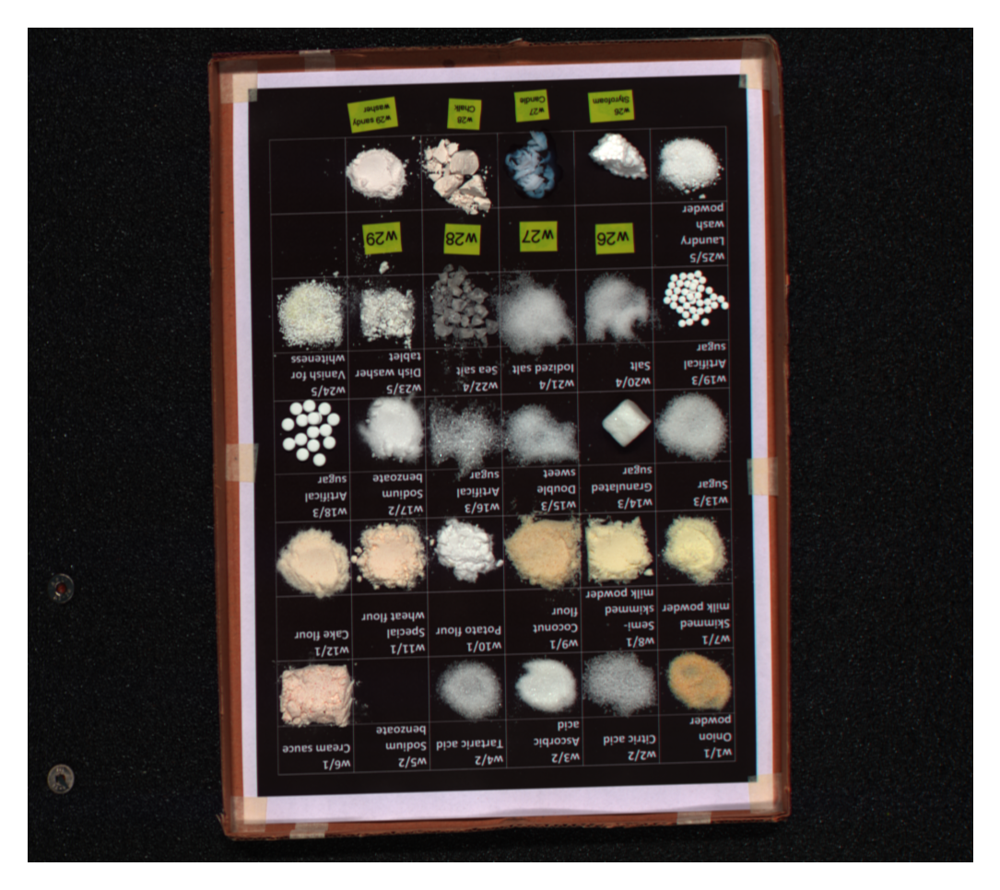

In [ ]:
# Show RGB image
# plt.rcParams['figure.dpi'] = 50, make it bigger to get bigger image
print(lines,samples)
RGB = numpy.empty((lines, samples, 3), dtype=numpy.float32)
ch_1 = 110
ch_2 = 42
ch_3 = 23
print(waves[ch_1])
print(waves[ch_2])
print(waves[ch_3])
#RGB[:,:,0] = spectral_image[:,ch_1,:]/numpy.amax(spectral_image[:,ch_1,:])
#RGB[:,:,1] = spectral_image[:,ch_2,:]/numpy.amax(spectral_image[:,ch_2,:])
#RGB[:,:,2] = spectral_image[:,ch_3,:]/numpy.amax(spectral_image[:,ch_3,:])
RGB[:,:,0] = spectral_cube[:,ch_1,:]
RGB[:,:,1] = spectral_cube[:,ch_2,:]
RGB[:,:,2] = spectral_cube[:,ch_3,:]
plt.rcParams['figure.dpi'] = 300
plt.axis('off')
plt.imshow(RGB)

plt.show()

[0.05139117 0.04939453 0.05222451]


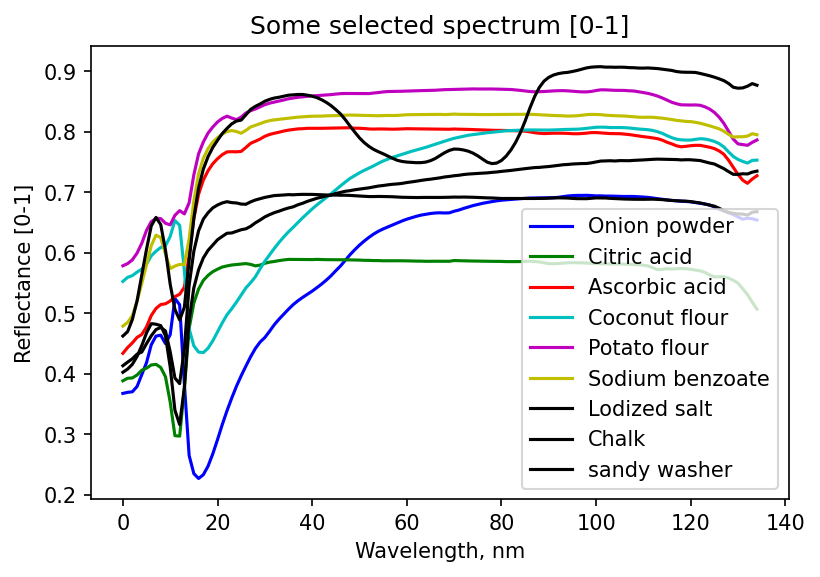

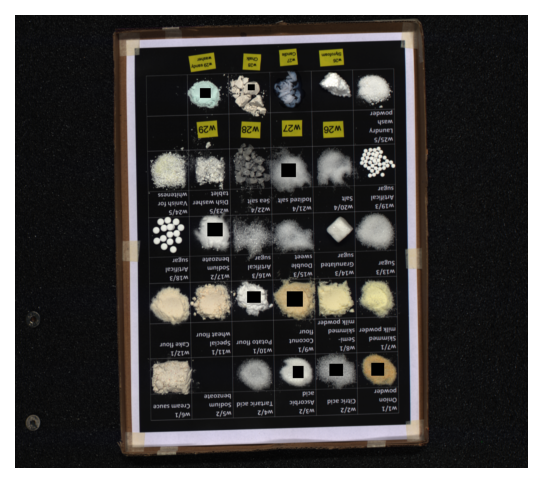

'\n# save \nsaveraw = "/content/drive/My Drive/Colab Notebooks/Temp/green.raw"\nfileobj = open(saveraw, mode=\'wb\')\nselection1.tofile(fileobj)\nfileobj.close()\n'

In [ ]:
# Selct area and plot its avearage spectrum
print(RGB[100,100,:])
RGB2 = RGB.copy()
##################################################################
# Select 1, Sea Salt
y1 = 1489
y2 = 1543
x1 = 1455
x2 = 1509
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection1,'b', label='Onion powder') 
##################################################################
# Select 2, Iodiazed Salt
y1 = 1314
y2 = 1371
x1 = 1459
x2 = 1510
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection2, 'g', label='Citric acid') 
##################################################################
# Select 3, Soda
y1 = 1161
y2 = 1206
x1 = 1468
x2 = 1519
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection3 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection3, 'r', label='Ascorbic acid') 
##################################################################
# Select 4, Citron Acid
y1 = 1136
y2 = 1203
x1 = 1156
x2 = 1220
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection4 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection4, 'c', label='Coconut flour') 
##################################################################
# Select 5, Dish-washer
y1 = 970
y2 = 1027
x1 = 1156
x2 = 1204
RGB2[x1:x2,y1:y2,0] = 0 # Make RGB black to see selection
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2] # crop spectral cube
sel1 = numpy.sum(sel, axis = 0)
selection5 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1)) # devide by the number of pixels in selection
plt.plot(selection5, 'm', label='Potato flour') 
##################################################################

# Select 6, Sugar
y1 = 804
y2 = 868
x1 = 869
x2 = 926
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection6 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(selection6, 'y', label='Sodium benzoate') 
##################################################################
# Select 7, Flour
y1 = 1113
y2 = 1174
x1 = 621
x2 = 678
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection7 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(selection7, 'k', label='Lodized salt') 

##################################################################
# Select 8, Flour
y1 = 973
y2 = 1002
x1 = 290
x2 = 315
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection8 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(selection8, 'k', label='Chalk') 

##################################################################
# Select 9, Flour
y1 = 773
y2 = 818
x1 = 306
x2 = 347
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection9 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(selection9, 'k', label='sandy washer') 
##################################################################
plt.title("Some selected spectrum [0-1]")
plt.tick_params(axis='both', which='major', labelsize=10)
plt.xlabel('Wavelength, nm')
plt.ylabel('Reflectance [0-1]')
plt.legend()
plt.show()


### Show RGB previes #############################################
plt.rcParams['figure.dpi'] = 150
plt.axis('off')
plt.imshow(RGB2)
plt.show()


'''
# save 
saveraw = "/content/drive/My Drive/Colab Notebooks/Temp/green.raw"
fileobj = open(saveraw, mode='wb')
selection1.tofile(fileobj)
fileobj.close()
'''


# IR powders

In [ ]:
# Read hdr
path = "/content/drive/MyDrive/ASI/Lab4/Task 2/ext ir/IR-white_powders (1)/capture"

[object_raw, object_hdr, white_raw, white_hdr, dark_raw, dark_hdr ] = readDir(path)
print(object_raw)
[samples, bands, lines, waves] = read_hdr(object_hdr)

open_path = object_raw
# Read raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
spectral_image = numpy.reshape(raw_image, (lines, bands, samples))
print('spectral_image.shape: ', spectral_image.shape)

/content/drive/MyDrive/ASI/Lab4/Task 2/ext ir/IR-white_powders (1)/capture/IR-green_scan_0061.raw
320
320 452 256
45
46
302
spectral_image.shape:  (452, 256, 320)


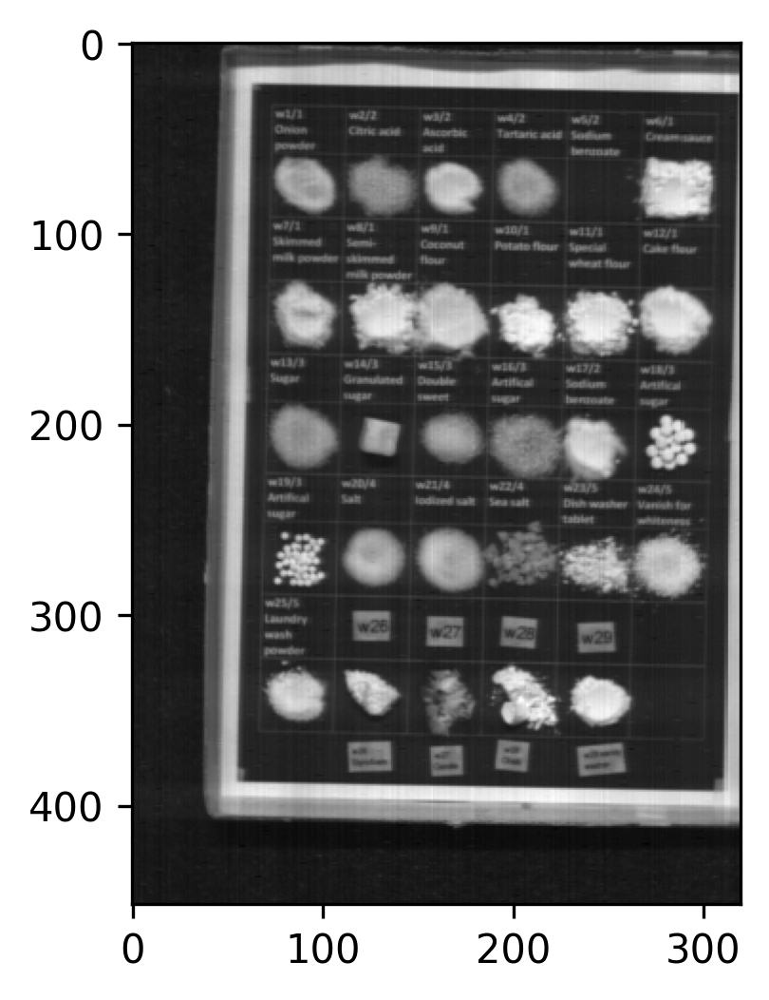

In [ ]:
# Plot picture and spectrum

plt.rcParams['figure.dpi'] = 300

#fig.suptitle('Spectral cube slice and single spectrum')
img = spectral_image[:,20,:]
# pale with selected band and vmax=4700
plt.imshow(img, cmap="gray")#

plt.show()

/content/drive/MyDrive/ASI/Lab4/Task 2/ext ir/IR-white_powders (1)/capture/WHITEREF_IR-green_scan_0061.hdr
320
320 249 256
45
46
302
320 256 249


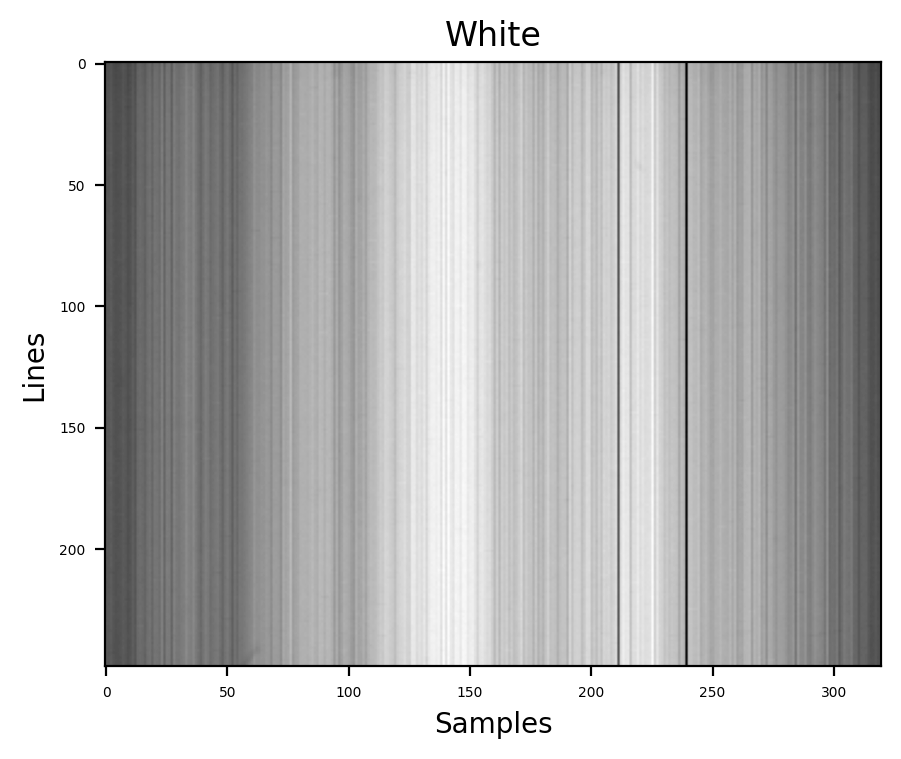

320
320 100 256
45
46
302


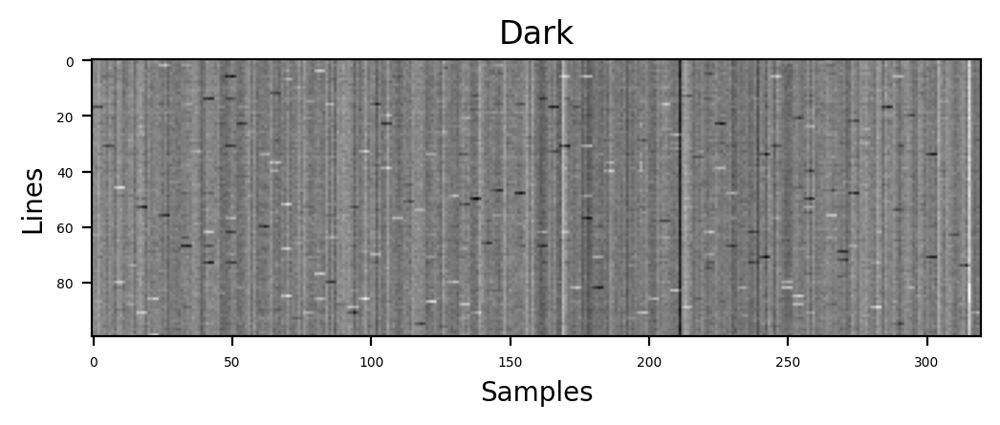

In [ ]:
# Read White
print(white_hdr)
[samples, bands, lines, waves] = read_hdr(white_hdr)
print(samples, bands, lines)
open_path = white_raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
white_image = numpy.reshape(raw_image, (lines, bands, samples))/lines
plt.rcParams['figure.dpi'] = 200
plt.imshow(white_image[:,100,:], cmap="gray")#
plt.title("White")
plt.xlabel('Samples')
plt.ylabel('Lines')
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()
###############################################
# Read Dark
[samples, bands, lines, waves] = read_hdr(dark_hdr)
open_path = dark_raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
dark_image = numpy.reshape(raw_image, (lines, bands, samples))/lines

plt.rcParams['figure.dpi'] = 200
plt.imshow(dark_image[:,100,:], cmap="gray")#
plt.title("Dark")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.xlabel('Samples')
plt.ylabel('Lines')
plt.show()

In [ ]:
# Calculate average for Dark and White

# Spectral_cube = upper_part/lower_part
# upper_part = spectral_image-dark
# lower_part = white - dark

white_av = numpy.sum(white_image, axis = 0) # get average for White
#print(white_image.shape)
#print(white_av.shape)
dark_av = numpy.sum(dark_image, axis = 0) # get average for White
#print(dark_image.shape)
#print(dark_av.shape)

[lines, bansd, samples] = spectral_image.shape
print(spectral_image.shape)
upper_part = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
spectral_cube = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
# Subtract [image - dark]
for i in range(lines):
  upper_part[i,:,:] = numpy.subtract(spectral_image[i,:,:], dark_av) 
# Subtract [white - dark]
lower_part = numpy.subtract(white_av, dark_av) 
# Subtract [image - dark]
for i in range(lines):
  spectral_cube[i,:,:] = numpy.divide(upper_part[i,:,:], lower_part)
# spectral_cube[:,:,:]  a white corrected spectral cube




(452, 256, 320)


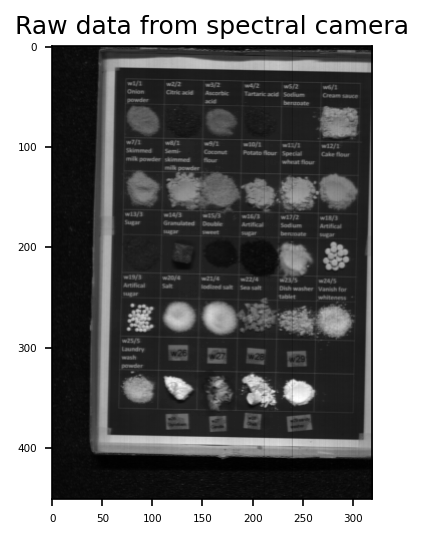

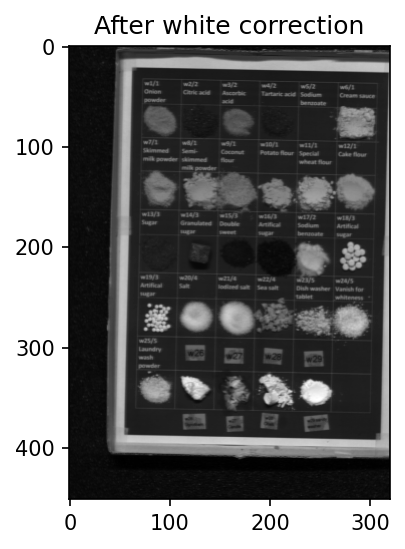

In [ ]:
# Plot results before and after white correction
plt.rcParams['figure.dpi'] = 150
plt.imshow(spectral_image[:,100,:], cmap="gray")#
plt.title("Raw data from spectral camera")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()
plt.imshow(spectral_cube[:,100,:], cmap="gray")#
plt.title("After white correction")
plt.tick_params(axis='both', which='major', labelsize=10)
plt.show()

1332.52
1205.8
1097.74


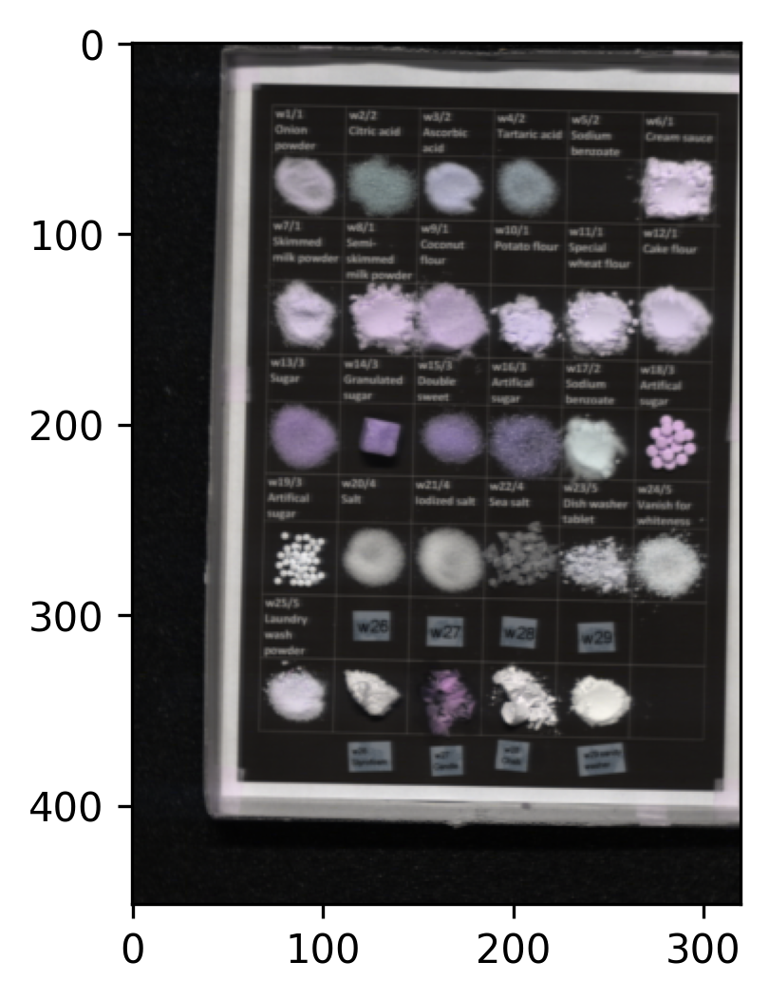

In [ ]:
# Show RGB image
# plt.rcParams['figure.dpi'] = 50, make it bigger to get bigger image
RGB = numpy.empty((lines, samples, 3), dtype=numpy.float32)
ch_1 = 65
ch_2 = 45
ch_3 = 28
print(waves[ch_1])
print(waves[ch_2])
print(waves[ch_3])
#RGB[:,:,0] = spectral_image[:,ch_1,:]/numpy.amax(spectral_image[:,ch_1,:])
#RGB[:,:,1] = spectral_image[:,ch_2,:]/numpy.amax(spectral_image[:,ch_2,:])
#RGB[:,:,2] = spectral_image[:,ch_3,:]/numpy.amax(spectral_image[:,ch_3,:])
RGB[:,:,0] = spectral_cube[:,ch_1,:]
RGB[:,:,1] = spectral_cube[:,ch_2,:]
RGB[:,:,2] = spectral_cube[:,ch_3,:]
plt.rcParams['figure.dpi'] = 300
plt.imshow(RGB)

plt.show()

[0.11633953 0.10691812 0.10075335]


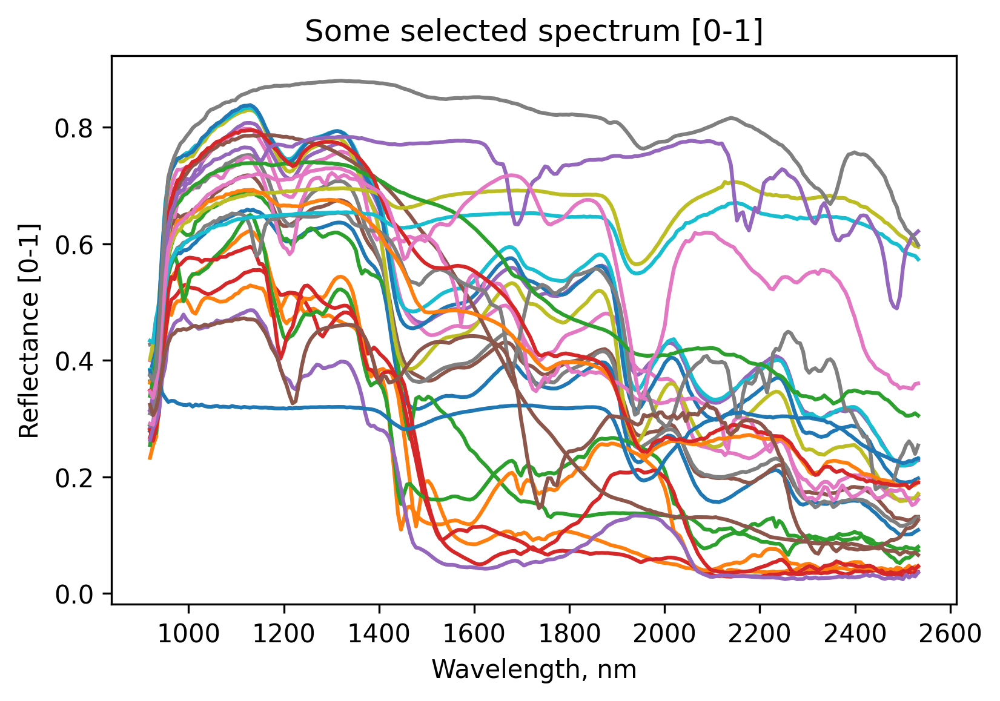

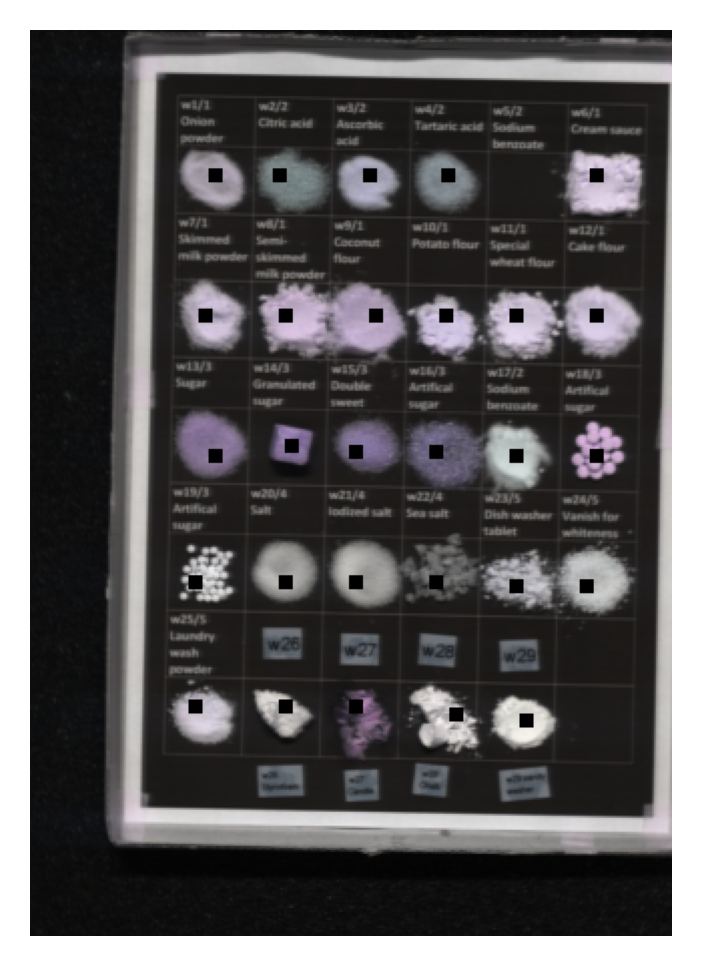

'\n# save \nsaveraw = "/content/drive/My Drive/Colab Notebooks/Temp/green.raw"\nfileobj = open(saveraw, mode=\'wb\')\nselection1.tofile(fileobj)\nfileobj.close()\n'

In [ ]:
# Selct area and plot its avearage spectrum
print(RGB[100,100,:])
RGB2 = RGB.copy()
##################################################################
# Select 1, onion powder
x1 = 70 -1
x2 = 75 +1
y1 = 90 -1
y2 = 95 +1
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(waves, selection1) 
##################################################################
# Select 2, citric acide
x1 = 70
x2 = 75
y1 = 120
y2 = 125

x1= x1-1
x2= x2+1
y1= y1-1+2
y2= y2+1+2

RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(waves, selection2) 
##################################################################
# Select 3, ascorbic acide
x1 = 70
x2 = 75
y1 = 175
y2 = 180

x1= x1-1
x2= x2+1
y1= y1-1-4-4
y2= y2+1-4-4


RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(waves, selection2) 
##################################################################
# Select 4, Tartaric Acid
x1 = 70
x2 = 75
y1 = 210
y2 = 215 

x1= x1-1
x2= x2+1
y1= y1-1-4
y2= y2+1-4

RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(waves, selection2) 
##################################################################
# Select 6, Cream sauce
x1 = 70
x2 = 75
y1 = 280
y2 = 285

x1= x1-1
x2= x2+1
y1= y1-1
y2= y2+1


RGB2[x1:x2,y1:y2,0] = 0 # Make RGB black to see selection
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2] # crop spectral cube
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1)) # devide by the number of pixels in selection
plt.plot(waves, selection2) 
##################################################################

# Select 7, skimmed milk powder
x1 = 140
x2 = 145
y1 = 85
y2 = 90 

x1= x1-1
x2= x2+1
y1= y1-1
y2= y2+1


RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(waves, selection2) 
##################################################################
# Select 8, semi skimmed milk poweder
x1 = 140
x2 = 145
y1 = 125
y2 = 130 

x1= x1-1
x2= x2+1
y1= y1-1
y2= y2+1


RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, selection2) 
##################################################################
# Select 9, coconut poweder
x1 = 140
x2 = 145
y1 = 170
y2 = 175 

x1= x1-1
x2= x2+1
y1= y1-1
y2= y2+1


RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, selection2) 
##################################################################
# Select 10, potato flour
x1 = 140
x2 = 145
y1 = 205
y2 = 210 

x1= x1-1
x2= x2+1
y1= y1-1
y2= y2+1


RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, selection2) 
##################################################################
# Select 11, special wheat flour
x1 = 140
x2 = 145
y1 = 240
y2 = 245 

x1= x1-1
x2= x2+1
y1= y1-1
y2= y2+1


RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, selection2) 
##################################################################
# Select 12, cake flour
x1 = 140
x2 = 145
y1 = 280
y2 = 285 

x1= x1-1
x2= x2+1
y1= y1-1
y2= y2+1


RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, selection2) 
##################################################################
# Select 13, sugar
x1 = 210
x2 = 215
y1 = 90
y2 = 95 

x1= x1-1
x2= x2+1
y1= y1-1
y2= y2+1

RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, selection2) 
##################################################################
# Select 14, granulated sugar
x1 = 210
x2 = 215
y1 = 125
y2 = 130 

x1= x1-1-2-3
x2= x2+1-2-3
y1= y1-1+3
y2= y2+1+3


RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, selection2) 
##################################################################
# Select 15, double sweet
x1 = 210
x2 = 215
y1 = 160
y2 = 165 

x1= x1-1-2
x2= x2+1-2
y1= y1-1
y2= y2+1


RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, selection2) 
##################################################################
# Select 16, artiftical sugar
x1 = 210
x2 = 215
y1 = 200
y2 = 205 

x1= x1-1-2
x2= x2+1-2
y1= y1-1
y2= y2+1


RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, selection2) 
##################################################################
# Select 17, sodium bicarbonate
x1 = 210
x2 = 215
y1 = 240
y2 = 245 

x1= x1-1
x2= x2+1
y1= y1-1
y2= y2+1


RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, selection2) 
##################################################################
# Select 18, artificial sugar
x1 = 210
x2 = 215
y1 = 280
y2 = 285 

x1= x1-1
x2= x2+1
y1= y1-1
y2= y2+1


RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, selection2) 
##################################################################
# Select 19, artificail sugar
x1 = 275
x2 = 280
y1 = 80
y2 = 85 

x1= x1-1-2
x2= x2+1-2
y1= y1-1
y2= y2+1


RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, selection2) 
##################################################################
# Select 20, salt
x1 = 275
x2 = 280
y1 = 125
y2 = 130 

x1= x1-1-2
x2= x2+1-2
y1= y1-1
y2= y2+1


RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, selection2) 
##################################################################
# Select 21, iodized salt
x1 = 275
x2 = 280
y1 = 160
y2 = 165 

x1= x1-1-2
x2= x2+1-2
y1= y1-1
y2= y2+1


RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, selection2) 
##################################################################
# Select 22, sea salt
x1 = 275
x2 = 280
y1 = 200
y2 = 205 

x1= x1-1-2
x2= x2+1-2
y1= y1-1
y2= y2+1


RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, selection2) 
##################################################################
# Select 23, dishwasher tablet
x1 = 275
x2 = 280
y1 = 240
y2 = 245 

x1= x1-1
x2= x2+1
y1= y1-1
y2= y2+1



RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, selection2) 
##################################################################
# Select 24, vanish for whiteness
x1 = 275
x2 = 280
y1 = 275
y2 = 280 

x1= x1-1
x2= x2+1
y1= y1-1
y2= y2+1



RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, selection2) 
##################################################################
# Select 25, laundary wash powder
x1 = 335
x2 = 340
y1 = 75
y2 = 80 

x1= x1-1
x2= x2+1
y1= y1-1+5
y2= y2+1+5



RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, selection2) 
##################################################################
# Select 26
x1 = 335
x2 = 340
y1 = 125
y2 = 130 

x1= x1-1
x2= x2+1
y1= y1-1
y2= y2+1



RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, selection2) 
##################################################################
# Select 27
x1 = 335
x2 = 340
y1 = 160
y2 = 165 

x1= x1-1
x2= x2+1
y1= y1-1
y2= y2+1


RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, selection2) 
##################################################################
# Select 28
x1 = 335
x2 = 340
y1 = 210
y2 = 215 

x1= x1-1+4
x2= x2+1+4
y1= y1-1
y2= y2+1


RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, selection2) 
##################################################################
# Select 29
x1 = 335
x2 = 340
y1 = 245
y2 = 250 

x1= x1-1+3+4
x2= x2+1+3+4
y1= y1-1
y2= y2+1

RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.rcParams['figure.dpi'] = 150
plt.plot(waves, selection2) 
##################################################################
plt.title("Some selected spectrum [0-1]")
plt.tick_params(axis='both', which='major', labelsize=10)
plt.xlabel('Wavelength, nm')
plt.ylabel('Reflectance [0-1]')
plt.show()


### Show RGB previes #############################################
plt.rcParams['figure.dpi'] = 300
plt.axis('off')
plt.imshow(RGB2)
plt.xticks(numpy.arange(0, 320, 50))
plt.yticks(numpy.arange(0, 452, 50))
# plt.grid(True)
plt.show()


'''
# save 
saveraw = "/content/drive/My Drive/Colab Notebooks/Temp/green.raw"
fileobj = open(saveraw, mode='wb')
selection1.tofile(fileobj)
fileobj.close()
'''


2437.16
1679.5
1490.44
(452, 320, 3)


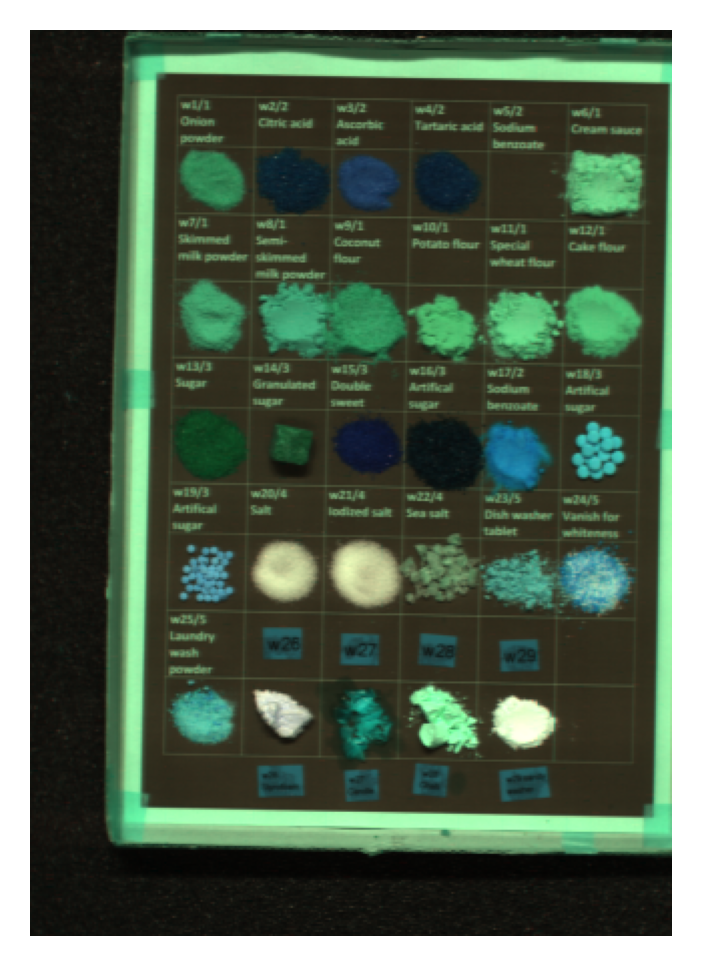

In [ ]:
# Show RGB image with new colors!
# plt.rcParams['figure.dpi'] = 50, make it bigger to get bigger image
RGB = numpy.empty((lines, samples, 3), dtype=numpy.float32)

# Good 80,160,22 or  90 160 220
ch_1 = 240#931.41nm

ch_2 = 120#500nm

ch_3 = 90#372.22nm

print(waves[ch_1])
print(waves[ch_2])
print(waves[ch_3])
#RGB[:,:,0] = spectral_image[:,ch_1,:]/numpy.amax(spectral_image[:,ch_1,:])
#RGB[:,:,1] = spectral_image[:,ch_2,:]/numpy.amax(spectral_image[:,ch_2,:])
#RGB[:,:,2] = spectral_image[:,ch_3,:]/numpy.amax(spectral_image[:,ch_3,:])
RGB[:,:,0] = 1.3*spectral_cube[:,ch_1,:]
RGB[:,:,1] = 1.3*spectral_cube[:,ch_2,:]
RGB[:,:,2] = 1.0*spectral_cube[:,ch_3,:]

print(RGB.shape)
plt.rcParams['figure.dpi'] = 300
plt.axis('off')
plt.imshow(RGB)

plt.show()

In [ ]:
from PIL import Image

#Plastic Samples (Task 3)

In [ ]:
# Read hdr
path = "/content/drive/MyDrive/ASI/Lab4/task 3/Plastic green leaves IR/ext/IR-plastics_3/capture"

[object_raw, object_hdr, white_raw, white_hdr, dark_raw, dark_hdr ] = readDir(path)
print(object_raw)
[samples, bands, lines, waves] = read_hdr(object_hdr)

open_path = object_raw
# Read raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
spectral_image = numpy.reshape(raw_image, (lines, bands, samples))
print('spectral_image.shape: ', spectral_image.shape)

/content/drive/MyDrive/ASI/Lab4/task 3/Plastic green leaves IR/ext/IR-plastics_3/capture/IR-green_scan_0092.raw
320
320 312 256
45
46
302
spectral_image.shape:  (312, 256, 320)


Text(0.5, 1.0, 'Single spectrum')

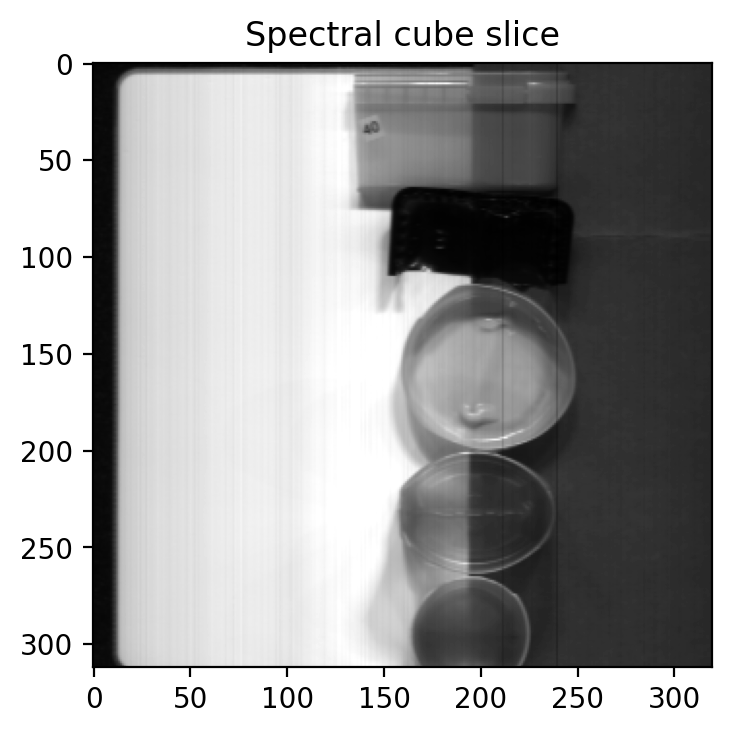

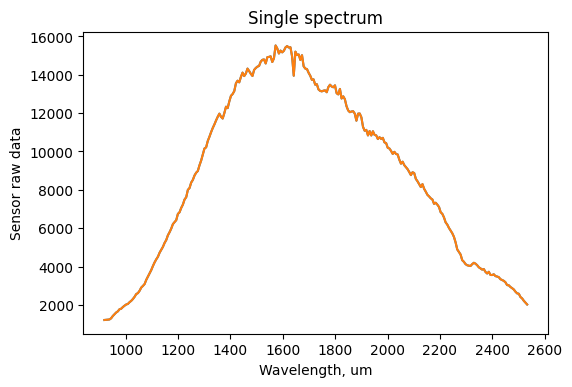

In [ ]:
# Plot picture and spectrum
plt.imshow(spectral_image[:,100,:], cmap="gray")
plt.title('Spectral cube slice')
plt.rcParams['figure.dpi'] = 100

plt.figure()
plt.plot(waves, spectral_image[100,:,100])
plt.plot(waves, spectral_image[100,:,100])#
plt.xlabel('Wavelength, um')
plt.ylabel('Sensor raw data')
plt.rcParams['figure.dpi'] = 150
plt.title('Single spectrum')

/content/drive/MyDrive/ASI/Lab4/task 3/Plastic green leaves IR/ext/IR-plastics_3/capture/WHITEREF_IR-green_scan_0092.hdr
320
320 191 256
45
46
302
320 256 191


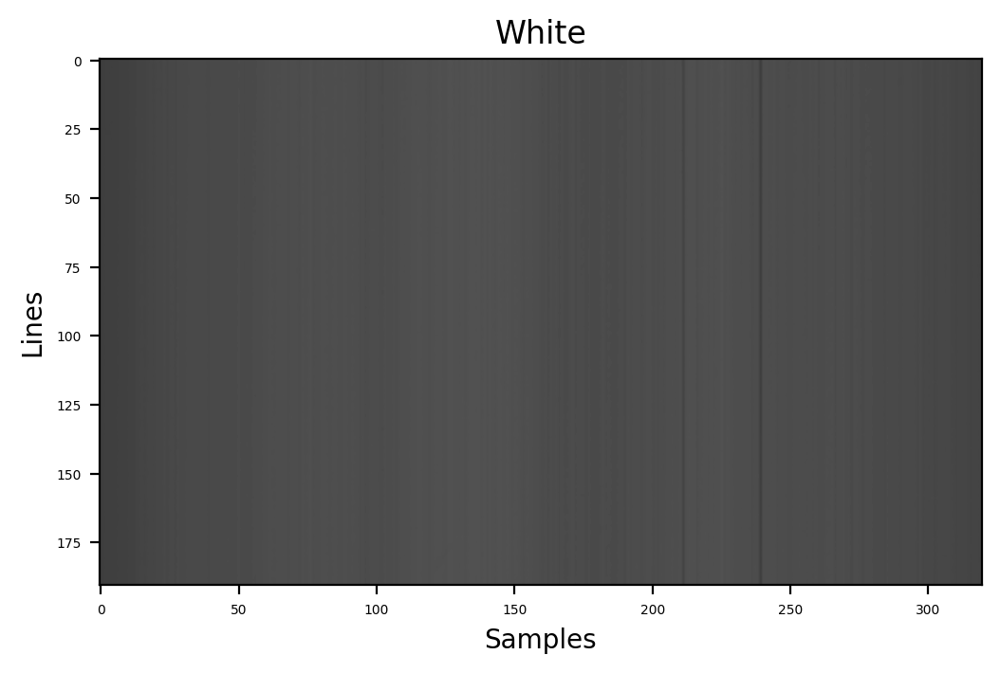

white samples, bands, and lines 320, 256, 191
320
320 100 256
45
46
302


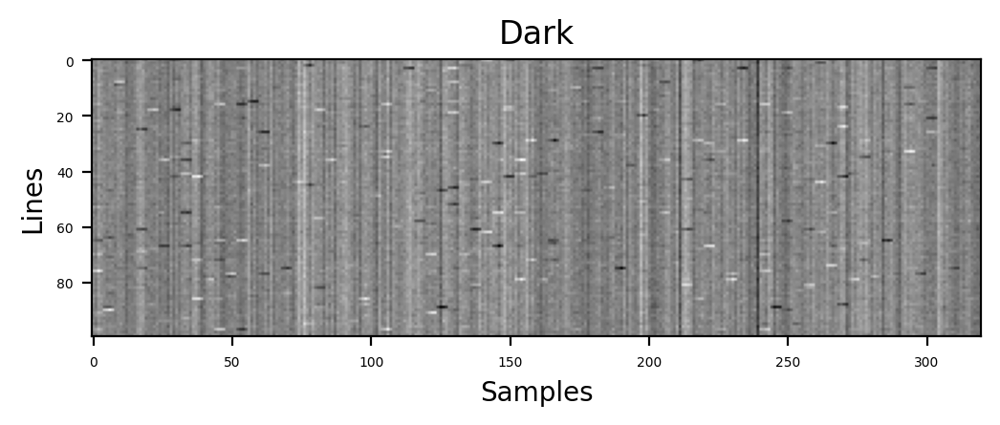

dark samples, bands, and lines 320, 256, 100


In [ ]:
# Read White
print(white_hdr)
[samples, bands, lines, waves] = read_hdr(white_hdr)
print(samples, bands, lines)
open_path = white_raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
white_image = numpy.reshape(raw_image, (lines, bands, samples))/lines
plt.rcParams['figure.dpi'] = 200
plt.imshow(white_image[:,100,:], cmap="gray", vmin=0, vmax=250)#
plt.title("White")
plt.xlabel('Samples')
plt.ylabel('Lines')
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()
print(f'white samples, bands, and lines {samples}, {bands}, {lines}')
###############################################
# Read Dark
[samples, bands, lines, waves] = read_hdr(dark_hdr)
open_path = dark_raw
fopen = open(open_path, "rb")
raw_image = numpy.fromfile(fopen, dtype=numpy.uint16) #uint16 float32 #count=spatial_pixels*sample_lines*spectral_bands
dark_image = numpy.reshape(raw_image, (lines, bands, samples))/lines

plt.rcParams['figure.dpi'] = 200
plt.imshow(dark_image[:,100,:], cmap="gray")#
plt.title("Dark")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.xlabel('Samples')
plt.ylabel('Lines')
plt.show()
print(f'dark samples, bands, and lines {samples}, {bands}, {lines}')

In [ ]:
# Calculate average for Dark and White

# Spectral_cube = upper_part/lower_part
# upper_part = spectral_image-dark
# lower_part = white - dark

white_av = numpy.sum(white_image, axis = 0) # get average for White
#print(white_image.shape)
#print(white_av.shape)
dark_av = numpy.sum(dark_image, axis = 0) # get average for White
#print(dark_image.shape)
#print(dark_av.shape)

[lines, bansd, samples] = spectral_image.shape
print(spectral_image.shape)
upper_part = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
spectral_cube = numpy.zeros((lines, bansd, samples), dtype=numpy.float32)
# Subtract [image - dark]
for i in range(lines):
  upper_part[i,:,:] = numpy.subtract(spectral_image[i,:,:], dark_av) 
# Subtract [white - dark]
lower_part = numpy.subtract(white_av, dark_av) 
# Subtract [image - dark]
for i in range(lines):
  spectral_cube[i,:,:] = numpy.divide(upper_part[i,:,:], lower_part)
# spectral_cube[:,:,:]  a white corrected spectral cube


(312, 256, 320)


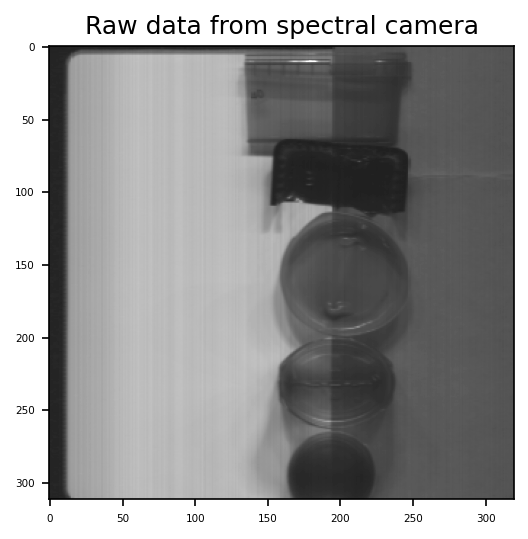

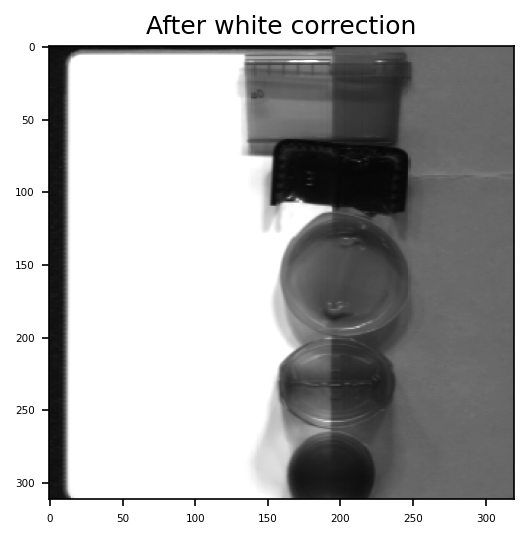

In [ ]:
# Plot results before and after white correction
plt.rcParams['figure.dpi'] = 150
plt.imshow(spectral_image[:,200,:], cmap="gray", vmin=0, vmax=10050)#
plt.title("Raw data from spectral camera")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()
plt.imshow(spectral_cube[:,200,:], cmap="gray", vmin=0, vmax= 1)#
plt.title("After white correction")
plt.tick_params(axis='both', which='major', labelsize=5)
plt.show()

1490.44
1237.51
1046.76


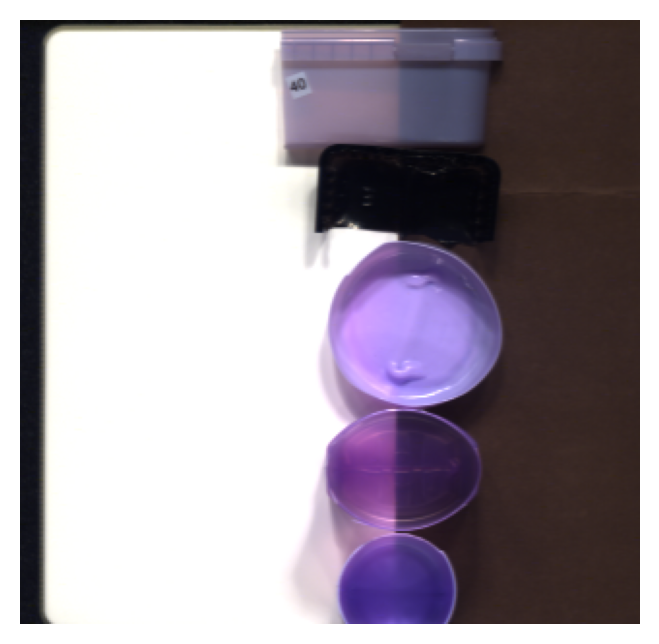

In [ ]:
# Show RGB image
# plt.rcParams['figure.dpi'] = 50, make it bigger to get bigger image
RGB = numpy.empty((lines, samples, 3), dtype=numpy.float32)
ch_1 = 90
ch_2 = 50
ch_3 = 20
print(waves[ch_1])
print(waves[ch_2])
print(waves[ch_3])
#RGB[:,:,0] = spectral_image[:,ch_1,:]/numpy.amax(spectral_image[:,ch_1,:])
#RGB[:,:,1] = spectral_image[:,ch_2,:]/numpy.amax(spectral_image[:,ch_2,:])
#RGB[:,:,2] = spectral_image[:,ch_3,:]/numpy.amax(spectral_image[:,ch_3,:])
RGB[:,:,0] = spectral_cube[:,ch_1,:]
RGB[:,:,1] = spectral_cube[:,ch_2,:]
RGB[:,:,2] = spectral_cube[:,ch_3,:]
plt.rcParams['figure.dpi'] = 200
plt.axis('off')
plt.imshow(RGB)

plt.show()

[1.049525  1.055243  1.0566137]


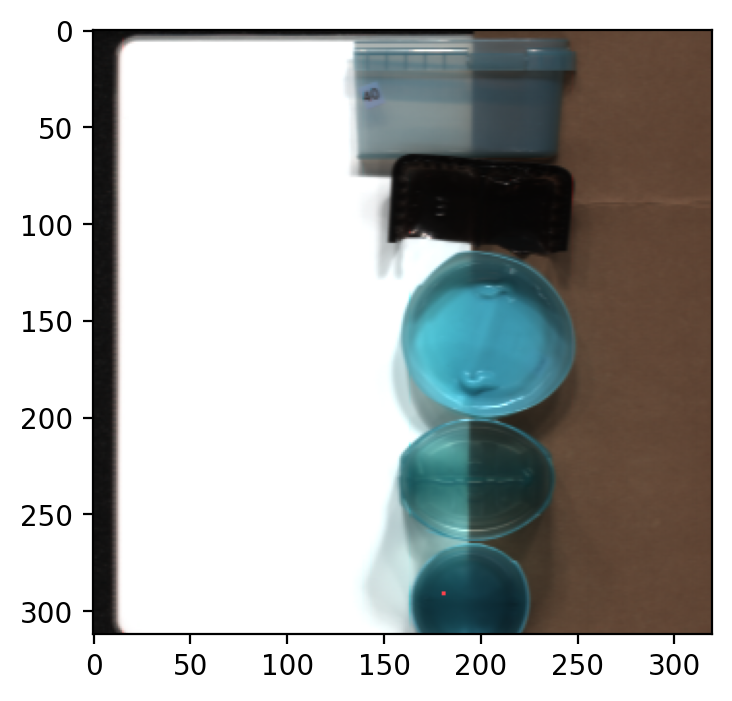

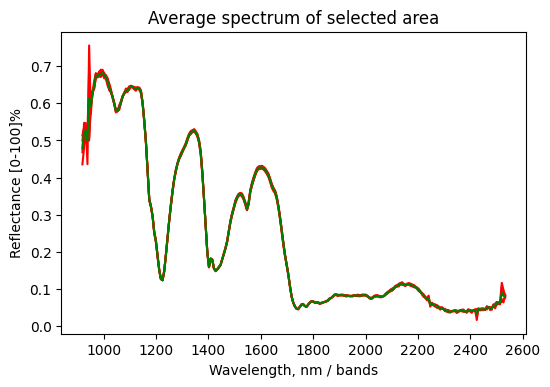

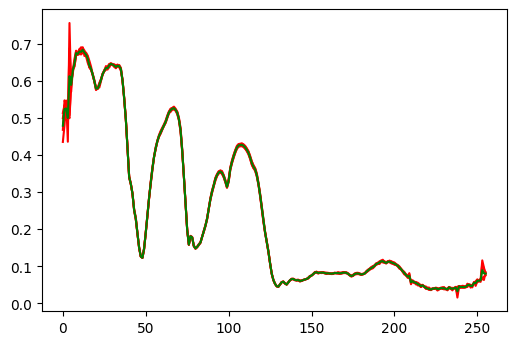

In [ ]:
# Selct area and plot its avearage spectrum
print(RGB[100,100,:])
RGB2 = RGB.copy()
##################################################################
# Select plastic leaf

# ----- Green ----
x1 = 290
x2 = 292
y1 = 180
y2 = 182


plt.rcParams['figure.dpi'] = 200

RGB2[x1:x2,y1:y2,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
#print(spectral_cube.shape)
#print(plastic.shape)

sel1 = numpy.sum(sel, axis = 0)
#print(pl1.shape)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
#print(pl2.shape)

##################################################################

plt.imshow(RGB2)
plt.rcParams['figure.dpi'] = 100
plt.show()


plt.figure()
for i in range(2):
  plt.plot(waves, sel[i,:,], 'r') #plt.plot(waves,selection1)
  
plt.plot(waves, selection1, 'g') #plt.plot(waves,selection1)
plt.xlabel('Wavelength, nm / bands')
plt.ylabel('Reflectance [0-100]%')
plt.title("Average spectrum of selected area")
plt.show()

plt.figure()
for i in range(2):
  plt.plot(sel[i,:,], 'r') #plt.plot(waves,selection1)
plt.plot(selection1, 'g') #plt.plot(waves,selection1)

plt.show()

312 256 320
42
55
68
115
217
RGB:  (312, 320, 3)
cube:  (312, 256, 320)
small cube:  (312, 320, 5)


1.5022129
1.2403557
1.4247944


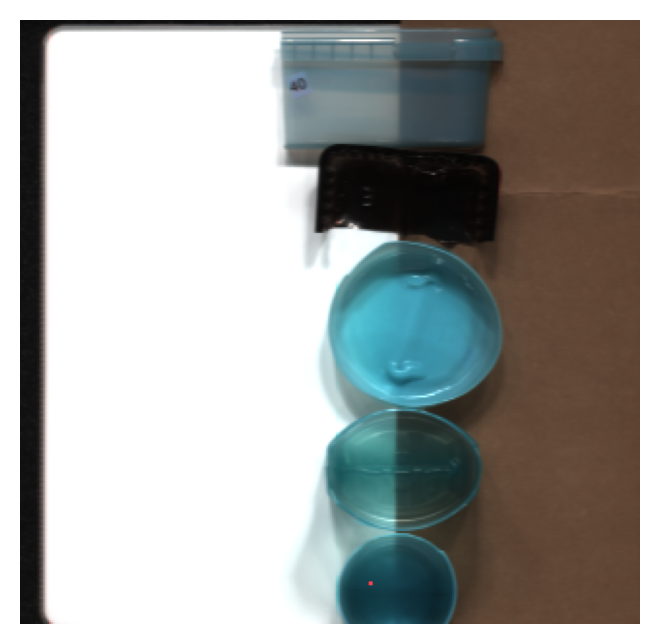

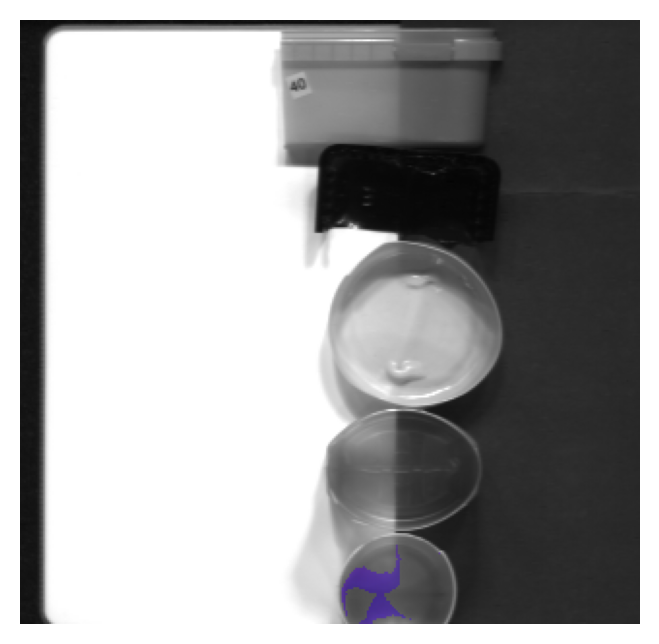

In [ ]:
# Generate Band based condition
n = 5 # the number of important bnds
bbands = numpy.empty(n, dtype=numpy.uint16) # array size of number of important bands
# we select the importqant bands:
bbands[0] = 42
bbands[1] = 55
bbands[2] = 68
bbands[3] = 115
bbands[4] = 217
selected = selection1.copy()

###################################################################################################
# ratio is an array of ratios: ratio[n]=selcted[bbands[n+1]]/selected[bbands[n]]
ratio = numpy.zeros(n) # array of ratios: ratio[n]=selcted[bbands[n+1]]/selected[bbands[n]]
for i in range(n):
  ratio[i] = selected[bbands[i]]
###################################################################################################
# now we make a new 'small_spectral_cube' made of selected bands from 'spectral_cube'
[s1, s2, s3] = spectral_cube.shape
print(s1, s2, s3)
small_spectral_cube = numpy.empty((lines, samples, n), dtype=numpy.float32)
i=0
for band in bbands:
  small_spectral_cube[:,:,i] = spectral_cube[:,band,:]
  print(band)
  i=i+1
print('RGB: ', RGB.shape)
print('cube: ', spectral_cube.shape)
print('small cube: ', small_spectral_cube.shape)

###################################################################################################
mask = RGB.copy()

for i in range(s1):  #s1
  for j in range(s3): #s3
    criteria = 0
    for ch in range(n):
      #mask[i,j,0]=1
      if numpy.abs((small_spectral_cube[i,j,ch]-ratio[ch]))>0.05: #[0.02 - 0.18] threshold
        criteria = 1
        # ´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´
        gray_color = (mask[i,j,0] + mask[i,j,1] + mask[i,j,2])/3 # make mask gray scale and only selection RGB
        mask[i,j,0]=gray_color
        mask[i,j,1]=gray_color
        mask[i,j,2]=gray_color                       
        # ´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´´
    if criteria == 0:
      pass

print(numpy.amax(small_spectral_cube))
print(numpy.amax(mask))
print(numpy.amax(RGB))
###################################################################################################
plt.rcParams['figure.dpi'] = 200
plt.axis('off')
plt.imshow(RGB2)

plt.show()
plt.rcParams['figure.dpi'] = 200
plt.axis('off')
plt.imshow(mask)

plt.show()

[1.0566137 1.0484056 1.0125723]


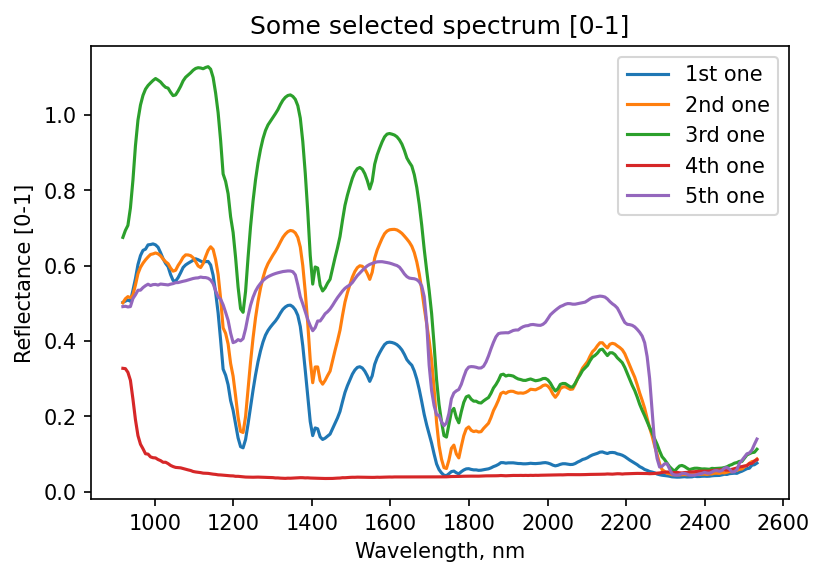

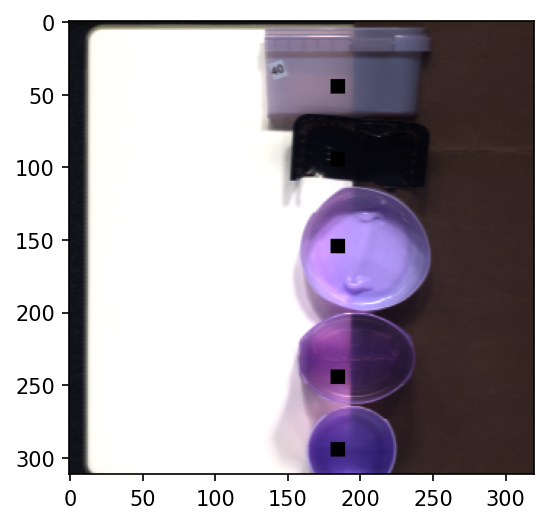

'\n# save \nsaveraw = "/content/drive/My Drive/Colab Notebooks/Temp/green.raw"\nfileobj = open(saveraw, mode=\'wb\')\nselection1.tofile(fileobj)\nfileobj.close()\n'

In [ ]:
# Selct area and plot its avearage spectrum
print(RGB[100,100,:])
RGB2 = RGB.copy()
##################################################################
# Select 1, onion powder
x1 = 290
x2 = 300
y1 = 180
y2 = 190
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection1 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(waves, selection1, label='1st one') 
##################################################################
# Select 2, citric acide
x1 = 240
x2 = 250
y1 = 180
y2 = 190
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
#plt.plot(selection9, 'k', label='2nd one') 
plt.plot(waves, selection2, label='2nd one') 
##################################################################
# Select 3, ascorbic acide
x1 = 150
x2 = 160
y1 = 180
y2 = 190
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(waves, selection2, label='3rd one') 
##################################################################
# Select 4, Tartaric Acid
x1 = 90
x2 = 100
y1 = 180
y2 = 190
RGB2[x1:x2,y1:y2,0] = 0
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[0,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2]
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1))
plt.plot(waves, selection2, label='4th one') 
##################################################################
# Select 6, Cream sauce
x1 = 40
x2 = 50
y1 = 180
y2 = 190
RGB2[x1:x2,y1:y2,0] = 0 # Make RGB black to see selection
RGB2[x1:x2,y1:y2,1] = 0
RGB2[x1:x2,y1:y2,2] = 0
#RGB2[:,:,0] = 255
sel = spectral_cube[x1:x2,:,y1:y2] # crop spectral cube
sel1 = numpy.sum(sel, axis = 0)
selection2 = numpy.sum(sel1, axis =1)/((x2-x1)*(y2-y1)) # devide by the number of pixels in selection
plt.plot(waves, selection2,label='5th one') 



##################################################################
plt.title("Some selected spectrum [0-1]")
plt.tick_params(axis='both', which='major', labelsize=10)
plt.xlabel('Wavelength, nm')
plt.ylabel('Reflectance [0-1]')
plt.legend()
plt.show()


### Show RGB previes #############################################
plt.rcParams['figure.dpi'] = 150
plt.imshow(RGB2)
plt.show()


'''
# save 
saveraw = "/content/drive/My Drive/Colab Notebooks/Temp/green.raw"
fileobj = open(saveraw, mode='wb')
selection1.tofile(fileobj)
fileobj.close()
'''
